In [1]:
from func import *

Graph signal processing is a new tool to model brain organization and function. The brain is composed of several Region of Interests(ROIs). Brain graphs provide an efficient way for modeling the human brain connectome, by associating nodes to the brain regions, and defining edges via anatomical or functional connections. These ROIs are connected to some regions of interests with the highest connectivity.

In [2]:
from nilearn.input_data import NiftiMasker

haxby_dataset = datasets.fetch_haxby(subjects=[3], fetch_stimuli=True, data_dir=data_dir)
func_file = haxby_dataset.func[0]

# Standardizing
mask_vt_file = haxby_dataset.mask_vt[0]
masker = NiftiMasker(mask_img=mask_vt_file, standardize=True)

# cognitive annotations
import pandas as pd
behavioral = pd.read_csv(haxby_dataset.session_target[0], delimiter=' ')
X = masker.fit_transform(func_file)
y = behavioral['labels']

In [3]:
categories = y.unique()
print(categories)
print('y:', y.shape)
print('X:', X.shape)

['rest' 'house' 'scrambledpix' 'face' 'shoe' 'chair' 'cat' 'bottle'
 'scissors']
y: (1452,)
X: (1452, 307)


Functional connectivity is a measure of the statistical dependency between different brain regions, and it is typically computed as the correlation coefficient between the time series of activity in different brain regions.

In [4]:
from nilearn.connectome import ConnectivityMeasure

# Set up connectivity measure
connectivity_measure = ConnectivityMeasure(kind='partial correlation')

# Compute connectivity matrix for each sample in X
X_connectome = []
for i in range(X.shape[0]):
    # Extract time series for each voxel in the mask
    voxel_time_series = X[i, :]
    voxel_time_series = voxel_time_series.reshape(-1, 1)

    # Compute functional connectivity matrix
    connectivity_matrix = connectivity_measure.fit_transform([voxel_time_series])[0]

    # Store connectivity matrix in 3D array
    X_connectome.append(connectivity_matrix)

X_connectome = np.array(X_connectome)

# Check the shape of X_connectome
print(X_connectome.shape)


(1452, 1, 1)


So we have 1452 time points in the imaging data, and for each time point we have recordings of fMRI activity across 675 brain regions.

to do:
1. visualize connectome in 3D 
    - derive coordinates of POI

Correlation matrix shape: (307, 307)


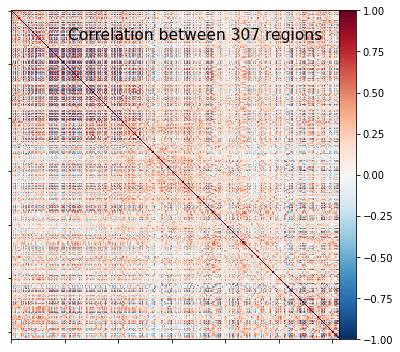

In [5]:
import warnings
warnings.filterwarnings(action='once')

import nilearn.connectome

# Estimating connectomes and save for pytorch to load
corr_measure = nilearn.connectome.ConnectivityMeasure(kind="correlation")
conn = corr_measure.fit_transform([X])[0]

n_regions_extracted = X.shape[-1]
title = 'Correlation between %d regions' % n_regions_extracted

print('Correlation matrix shape:',conn.shape)

# First plot the matrix
from nilearn import plotting
display = plotting.plot_matrix(conn, vmax=1, vmin=-1,
                               colorbar=True, title=title)

In [6]:
graph = make_group_graph([conn], self_loops=False, k=8, symmetric=True)

In [7]:
# generate data
import pandas as pd
import numpy as np

# cancatenate the same type of trials
concat_bold = {}
for label in categories:
    cur_label_index = y.index[y == label].tolist()
    curr_bold_seg = X[cur_label_index]    
    concat_bold[label] = curr_bold_seg

In [8]:
# split the data by time window size and save to file
window_length = 1
dic_labels = {name: i for i, name in enumerate(categories)}

# set output paths
split_path = os.path.join(data_dir, 'haxby_split_win/')
if not os.path.exists(split_path):
    os.makedirs(split_path)
out_file = os.path.join(split_path, '{}_{:04d}.npy')
out_csv = os.path.join(split_path, 'labels.csv')

label_df = pd.DataFrame(columns=['label', 'filename'])
for label, ts_data in concat_bold.items():
    ts_duration = len(ts_data)
    ts_filename = f"{label}_seg"
    valid_label = dic_labels[label]

    # Split the timeseries
    rem = ts_duration % window_length
    n_splits = int(np.floor(ts_duration / window_length))

    ts_data = ts_data[:(ts_duration - rem), :]   

    for j, split_ts in enumerate(np.split(ts_data, n_splits)):
        ts_output_file_name = out_file.format(ts_filename, j)

        split_ts = np.swapaxes(split_ts, 0, 1)
        np.save(ts_output_file_name, split_ts)

        curr_label = {'label': valid_label, 'filename': os.path.basename(ts_output_file_name)}
        label_df = label_df.append(curr_label, ignore_index=True)
        
label_df.to_csv(out_csv, index=False) 

C:\Users\33433\AppData\Local\Temp/ipykernel_39072/662607616.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(curr_label, ignore_index=True)
C:\Users\33433\AppData\Local\Temp/ipykernel_39072/662607616.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(curr_label, ignore_index=True)
C:\Users\33433\AppData\Local\Temp/ipykernel_39072/662607616.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(curr_label, ignore_index=True)
C:\Users\33433\AppData\Local\Temp/ipykernel_39072/662607616.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_d

### SVM

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)   


In [19]:
from sklearn.svm import SVC
model_svm = SVC(random_state=0, kernel='linear', C=1)
model_svm.fit(X_train, y_train)

SVC(C=1, kernel='linear', random_state=0)

In [20]:
from sklearn.metrics import classification_report
y_train_pred = model_svm.predict(X_train)
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

      bottle       1.00      1.00      1.00        88
         cat       1.00      1.00      1.00        88
       chair       1.00      1.00      1.00        88
        face       1.00      1.00      1.00        88
       house       1.00      1.00      1.00        86
        rest       1.00      1.00      1.00       471
    scissors       1.00      1.00      1.00        81
scrambledpix       1.00      1.00      1.00        93
        shoe       1.00      1.00      1.00        78

    accuracy                           1.00      1161
   macro avg       1.00      1.00      1.00      1161
weighted avg       1.00      1.00      1.00      1161



In [21]:
y_test_pred = model_svm.predict(X_test)
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

      bottle       0.55      0.80      0.65        20
         cat       0.80      0.80      0.80        20
       chair       0.77      0.85      0.81        20
        face       0.90      0.90      0.90        20
       house       0.95      0.95      0.95        22
        rest       0.90      0.90      0.90       117
    scissors       0.59      0.48      0.53        27
scrambledpix       0.79      0.73      0.76        15
        shoe       0.88      0.73      0.80        30

    accuracy                           0.82       291
   macro avg       0.79      0.79      0.79       291
weighted avg       0.83      0.82      0.82       291



In [25]:
# confusion matrix
import sys
import numpy as np
from sklearn.metrics import confusion_matrix
sys.path.append('../src')
import visualization
cm_svm = confusion_matrix(y_test, y_test_pred)
model_conf_matrix = cm_svm.astype('float') / cm_svm.sum(axis=1)[:, np.newaxis]

visualization.conf_matrix(model_conf_matrix,
                          categories,
                          title='SVM decoding results on Haxby')

AttributeError: module 'visualization' has no attribute 'conf_matrix'

c:\Users\33433\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



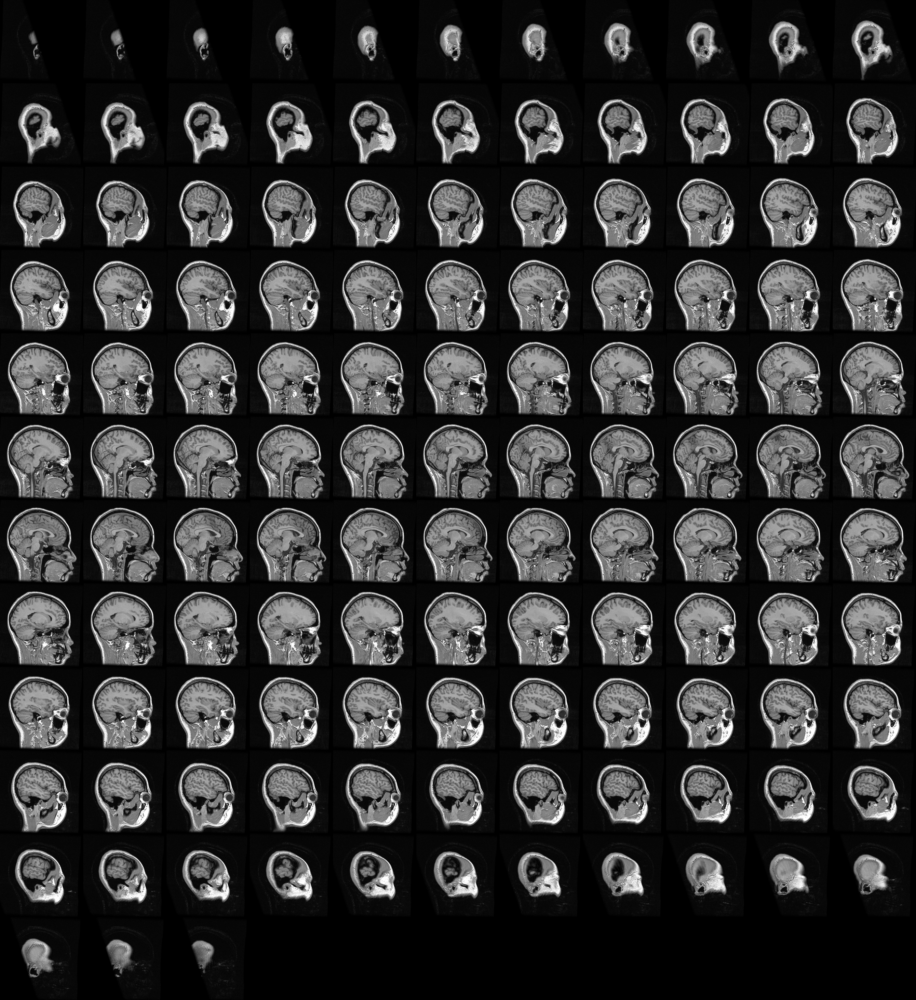
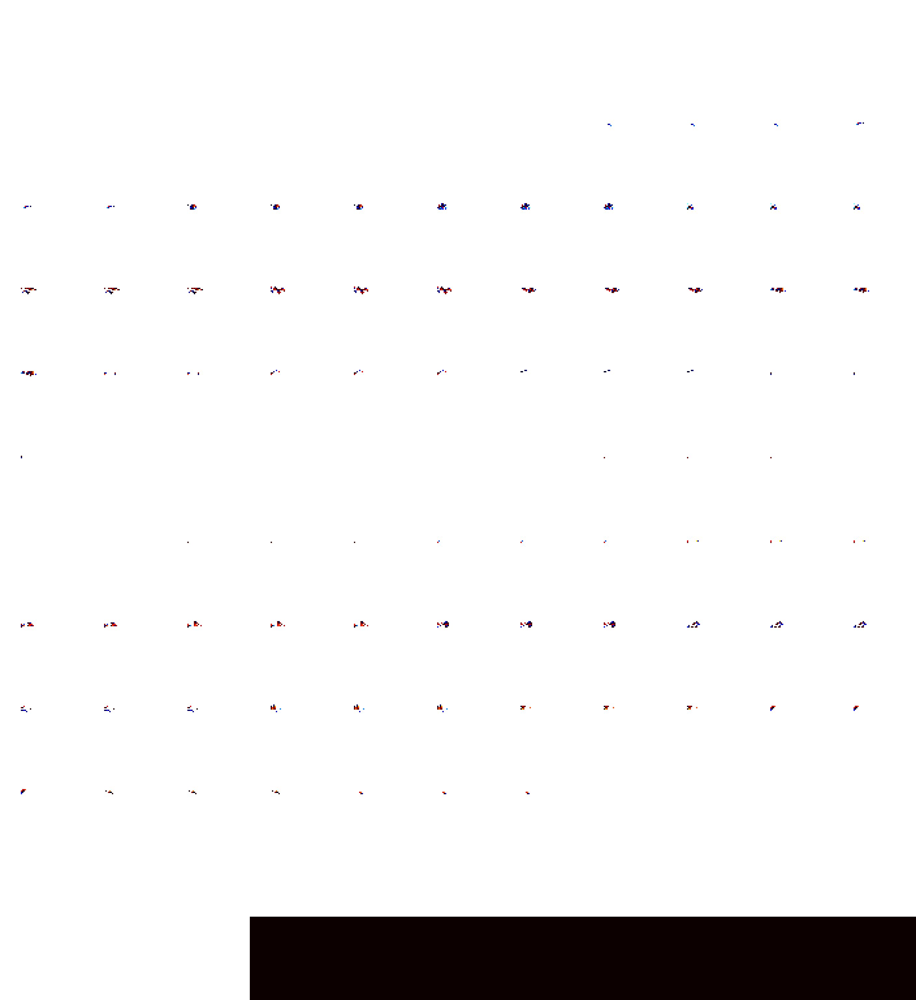

In [26]:
from nilearn import plotting
# first row of coef_ is comparing the first pair of class labels
# with 9 classes, there are 9 * 8 / 2 distinct
coef_img = masker.inverse_transform(model_svm.coef_[0, :])
plotting.view_img(
    coef_img, bg_img=haxby_dataset.anat[0],
    title="SVM weights", dim=-1, resampling_interpolation='nearest'
)

In [9]:
# split dataset
from gcn_windows_dataset import TimeWindowsDataset

random_seed = 0

train_dataset = TimeWindowsDataset(
    data_dir=split_path, 
    partition="train", 
    random_seed=random_seed, 
    pin_memory=True, 
    normalize=True,
    shuffle=True)

valid_dataset = TimeWindowsDataset(
    data_dir=split_path, 
    partition="valid", 
    random_seed=random_seed, 
    pin_memory=True, 
    normalize=True,
    shuffle=True)

test_dataset = TimeWindowsDataset(
    data_dir=split_path, 
    partition="test", 
    random_seed=random_seed, 
    pin_memory=True, 
    normalize=True,
    shuffle=True)

print("train dataset: {}".format(train_dataset))
print("valid dataset: {}".format(valid_dataset))
print("test dataset: {}".format(test_dataset))

train dataset: 1016*(torch.Size([307, 1]), ())
valid dataset: 290*(torch.Size([307, 1]), ())
test dataset: 146*(torch.Size([307, 1]), ())


### Graph Convolutional Network

In [10]:
import torch
from torch.utils.data import DataLoader

batch_size = 10

torch.manual_seed(random_seed)
train_generator = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_generator = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_generator = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
train_features, train_labels = next(iter(train_generator))
print(f"Feature batch shape: {train_features.size()}; mean {torch.mean(train_features)}")
print(f"Labels batch shape: {train_labels.size()}; mean {torch.mean(torch.Tensor.float(train_labels))}")

Feature batch shape: torch.Size([10, 307, 1]); mean -2.795787823473006e-09
Labels batch shape: torch.Size([10]); mean 2.9000000953674316


In [11]:
from gcn_model import GCN

gcn = GCN(graph.edge_index, 
          graph.edge_attr, 
          n_roi=X.shape[1],
          batch_size=batch_size,
          n_timepoints=window_length, 
          n_classes=len(categories))
gcn

GCN(
  (conv1): ChebConv(1, 32, K=2, normalization=sym)
  (conv2): ChebConv(32, 32, K=2, normalization=sym)
  (conv3): ChebConv(32, 10, K=2, normalization=sym)
  (fc1): Linear(in_features=3070, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=9, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

In [12]:
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)    

    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        loss, current = loss.item(), batch * dataloader.batch_size

        correct = (pred.argmax(1) == y).type(torch.float).sum().item()
        correct /= X.shape[0]
        if (batch % 10 == 0) or (current == size):
            print(f"#{batch:>5};\ttrain_loss: {loss:>0.3f};\ttrain_accuracy:{(100*correct):>5.1f}%\t\t[{current:>5d}/{size:>5d}]")

        
def valid_test_loop(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    loss, correct = 0, 0

    with torch.no_grad():
        for X, y in dataloader:
            pred = model.forward(X)
            loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    loss /= size
    correct /= size

    return loss, correct

In [13]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(gcn.parameters(), lr=1e-4, weight_decay=5e-4)

epochs = 25
for t in range(epochs):
    print(f"Epoch {t+1}/{epochs}\n-------------------------------")
    train_loop(train_generator, gcn, loss_fn, optimizer)
    loss, correct = valid_test_loop(valid_generator, gcn, loss_fn)
    print(f"Valid metrics:\n\t avg_loss: {loss:>8f};\t avg_accuracy: {(100*correct):>0.1f}%")

Epoch 1/25
-------------------------------
#    0;	train_loss: 2.208;	train_accuracy: 10.0%		[    0/ 1016]
#   10;	train_loss: 2.011;	train_accuracy: 40.0%		[  100/ 1016]
#   20;	train_loss: 1.597;	train_accuracy: 60.0%		[  200/ 1016]
#   30;	train_loss: 1.862;	train_accuracy: 40.0%		[  300/ 1016]
#   40;	train_loss: 2.377;	train_accuracy: 20.0%		[  400/ 1016]
#   50;	train_loss: 2.246;	train_accuracy: 20.0%		[  500/ 1016]
#   60;	train_loss: 1.863;	train_accuracy: 40.0%		[  600/ 1016]
#   70;	train_loss: 1.856;	train_accuracy: 40.0%		[  700/ 1016]
#   80;	train_loss: 2.046;	train_accuracy: 30.0%		[  800/ 1016]
#   90;	train_loss: 1.853;	train_accuracy: 40.0%		[  900/ 1016]
#  100;	train_loss: 1.905;	train_accuracy: 30.0%		[ 1000/ 1016]
Valid metrics:
	 avg_loss: 0.183278;	 avg_accuracy: 43.4%
Epoch 2/25
-------------------------------
#    0;	train_loss: 1.573;	train_accuracy: 60.0%		[    0/ 1016]
#   10;	train_loss: 1.792;	train_accuracy: 40.0%		[  100/ 1016]
#   20;	train_loss: 2.05

In [16]:
# results
loss, correct = valid_test_loop(test_generator, gcn, loss_fn)
print(f"Test metrics:\n\t avg_loss: {loss:>f};\t avg_accuracy: {(100*correct):>0.1f}%")

Test metrics:
	 avg_loss: 0.129638;	 avg_accuracy: 66.4%
